# <center> LDA per Tweet</center>

Followed by FCN2_CleanbyTweets
1. Load data
2. Pre-Cleaning - Remove https
3. Language Detection - Select only English and high accuracy
4. Cleaning/Remove:  
    Stop words  
    Words Statistics(TF-IDF)  (需要吗)
5. LDA Model
6. Merge to Grid
7. Export

Introduction  
Github Notebook: https://github.com/wjbmattingly/topic_modeling_textbook

In [3]:
# https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#1introduction
import re
import json
import glob
import string
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy
import spacy
from nltk.corpus import stopwords

# vis
import pyLDAvis
import pyLDAvis.gensim_models 

import time
from datetime import timedelta

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [4]:
# Check Package Version
from importlib.metadata import version
version('spacy')

'3.3.0'

# Load Data 

## Twitter file 

In [ ]:
df = pd.read_csv('/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/Nairobi_1922/Sum/Clean1Tweets.csv', lineterminator='\n')
df

## Export Path

In [ ]:
Export = '/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/Nairobi_1922/LDATw/'

# Data Pre-Cleaning

## Remove: URL, Auto-generated, Nariobi, Kenya

In [ ]:
# Preparing the Data

Texts = df.text.tolist()
Texts
# len(Texts)

In [ ]:
# Remove Action

Preclean_text = []
for text in Texts:    
    text = re.sub(r'Just posted a photo', '', str(text), flags=re.MULTILINE)  # Auto-generated for pic
    text = re.sub(r'Just posted a video', '', str(text), flags=re.MULTILINE)  # Auto-generated for video    
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text, flags=re.MULTILINE) # URL
    text = re.sub(r'(nairobi|Nairobi)', '', text, flags=re.MULTILINE) # Nariobi
    text = re.sub(r'kenya|Kenya', '', text, flags=re.MULTILINE)  # Kenya
    Preclean_text.append(text)
df.text = Preclean_text
df

# Language Detection
Source: https://towardsdatascience.com/4-python-libraries-to-detect-english-and-non-english-language-c82ad3efd430  

## Language Detection

In [8]:
import spacy
from spacy.language import Language
from spacy_langdetect import LanguageDetector

import time
from datetime import timedelta

def create_lang_detector(nlp, name):
    return LanguageDetector()

In [9]:
Language.factory("language_detector", func = create_lang_detector)
nlp = spacy.load('en_core_web_sm') 
nlp.add_pipe('language_detector', last = True) 

In [ ]:
# Language Detection

start_time = time.monotonic()
df['Language'] = df['text'].apply(lambda x: nlp(x)._.language['language']) 
end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

df
# Time: 43min

### Export with Language Identified

In [ ]:
df.to_csv(Export + 'dfAllLanguage.csv', index = False)

## Check All Languages

In [ ]:
# Check All Different Languages

UniqueLang = set(df.Language.tolist())
UniqueLang

In [ ]:
# Non-duplicated Language Counts

len(UniqueLang)
# len(CleanedDoc[~CleanedDoc.duplicated('Language')]['Language'].tolist())  

##### Language Abbreviation  
language_short_name = {'aa':'Afar','ab':'Abkhazian','af':'Afrikaans','ak':'Akan','sq':'Albanian','am':'Amharic','ar':'Arabic',
'an':'Aragonese','hy':'Armenian','as':'Assamese','av':'Avaric','ae':'Avestan','ay':'Aymara','az':'Azerbaijani','ba':'Bashkir',
'bm':'Bambara','eu':'Basque','be':'Belarusian','bn':'Bengali','bh':'Bihari languages','bi':'Bislama','bo':'Tibetan','bs':'Bosnian',
'br':'Breton','bg':'Bulgarian','my':'Burmese','ca':'Catalan; Valencian','cs':'Czech','ch':'Chamorro','ce':'Chechen','zh':'Chinese',
'cu':'Church Slavic; Old Slavonic; Church Slavonic; Old Bulgarian; Old Church Slavonic','cv':'Chuvash','kw':'Cornish','co':'Corsican',
'cr':'Cree','cy':'Welsh','cs':'Czech','da':'Danish','de':'German','dv':'Divehi; Dhivehi; Maldivian','nl':'Dutch; Flemish','dz':'Dzongkha',
'el':'Greek-Modern (1453-)','en':'English','eo':'Esperanto','et':'Estonian','eu':'Basque','ee':'Ewe','fo':'Faroese','fa':'Persian',
'fj':'Fijian','fi':'Finnish','fr':'French','fy':'Western Frisian','ff':'Fulah','Ga':'Georgian','gd':'Gaelic; Scottish Gaelic','ga':'Irish',
'gl':'Galician','gv':'Manx','el':'Greek-Modern (1453-)','gn':'Guarani','gu':'Gujarati','ht':'Haitian; Haitian Creole','ha':'Hausa',
'he':'Hebrew','hz':'Herero','hi':'Hindi','ho':'Hiri Motu','hr':'Croatian','hu':'Hungarian','hy':'Armenian','ig':'Igbo','is':'Icelandic',
'io':'Ido','ii':'Sichuan Yi; Nuosu','iu':'Inuktitut','ie':'Interlingue; Occidental',
'ia':'Interlingua (International Auxiliary Language Association)','id':'Indonesian','ik':'Inupiaq','is':'Icelandic','it':'Italian',
'jv':'Javanese','ja':'Japanese','kl':'Kalaallisut; Greenlandic','kn':'Kannada','ks':'Kashmiri','ka':'Georgian','kr':'Kanuri','kk':'Kazakh',
'km':'Central Khmer','ki':'Kikuyu; Gikuyu','rw':'Kinyarwanda','ky':'Kirghiz; Kyrgyz','kv':'Komi','kg':'Kongo','ko':'Korean',
'kj':'Kuanyama; Kwanyama','ku':'Kurdish','lo':'Lao','la':'Latin','lv':'Latvian','li':'Limburgan; Limburger; Limburgish','ln':'Lingala',
'lt':'Lithuanian','lb':'Luxembourgish; Letzeburgesch','lu':'Luba-Katanga','lg':'Ganda','mk':'Macedonian','mh':'Marshallese',
'ml':'Malayalam','mi':'Maori','mr':'Marathi','ms':'Malay','Mi':'Micmac','mk':'Macedonian','mg':'Malagasy','mt':'Maltese',
'mn':'Mongolian','mi':'Maori','ms':'Malay','my':'Burmese','na':'Nauru','nv':'Navajo; Navaho','nr':'Ndebele-South; South Ndebele',
'nd':'Ndebele-North; North Ndebele','ng':'Ndonga','ne':'Nepali','nl':'Dutch; Flemish','nn':'Norwegian Nynorsk; Nynorsk:Norwegian',
'nb':'Bokmål-Norwegian; Norwegian Bokmål','no':'Norwegian','oc':'Occitan (post 1500)','oj':'Ojibwa','or':'Oriya','om':'Oromo',
'os':'Ossetian; Ossetic','pa':'Panjabi; Punjabi','fa':'Persian','pi':'Pali','pl':'Polish','pt':'Portuguese','ps':'Pushto; Pashto',
'qu':'Quechua','rm':'Romansh','ro':'Romanian; Moldavian; Moldovan','rn':'Rundi','ru':'Russian','sg':'Sango','sa':'Sanskrit',
'si':'Sinhala; Sinhalese','sk':'Slovak','sk':'Slovak','sl':'Slovenian','se':'Northern Sami','sm':'Samoan','sn':'Shona','sd':'Sindhi',
'so':'Somali','st':'Sotho-Southern','es':'Spanish; Castilian','sq':'Albanian','sc':'Sardinian','sr':'Serbian','ss':'Swati',
'su':'Sundanese','sw':'Swahili','sv':'Swedish','ty':'Tahitian','ta':'Tamil','tt':'Tatar','te':'Telugu','tg':'Tajik','tl':'Tagalog',
'th':'Thai','bo':'Tibetan','ti':'Tigrinya','to':'Tonga (Tonga Islands)','tn':'Tswana','ts':'Tsonga','tk':'Turkmen','tr':'Turkish',
'tw':'Twi','ug':'Uighur; Uyghur','uk':'Ukrainian','ur':'Urdu','uz':'Uzbek','ve':'Venda','vi':'Vietnamese','vo':'Volapük','cy':'Welsh',
'wa':'Walloon','wo':'Wolof','xh':'Xhosa','yi':'Yiddish','yo':'Yoruba','za':'Zhuang; Chuang','zh':'Chinese','zu':'Zulu'}

## Select English Tweets

In [ ]:
dfEn = df[df['Language'] == 'en']
dfEn

In [ ]:
# Export
dfEn.to_csv(Export + 'dfEn.csv', index = False)

In [5]:
# Reload
dfEn = pd.read_csv(Export + 'dfEn.csv', lineterminator='\n')
dfEn

,id,text,userid,lat,lon,created_at,Language
0,1079755309281890305,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,en
1,1079759392138907649,365/365 \n#whereveryouare #haveagoodone #beTha...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,en
2,1079760884526972928,"Happy 2019 from us @ ,",51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,en
3,1079762365644660736,"We ride together, We shine together. @ ,",89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,en
4,1079765001454477312,We set to usher in the new year 2019 in style ...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,en
...,...,...,...,...,...,...,...
252483,1542517738907635716,#ReggaeRoadBlock each and every sunday live in...,1451360360,-1.283333,36.816667,2022-06-30 14:37:42+00:00,en
252484,1542517995347406850,"Hello everyone, I love black tea and have rece...",1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en
252485,1542517996685369344,find only n tea and not a blend. I have ordere...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en
252486,1542517994080702464,✦ [ Sakaja ]\n\nQuestion from an American\n\n,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en


## Select High Accuracy Tweets (Optional)

In [10]:
# Time LangAcc Process  
start_time = time.monotonic()
dfEn['LangAcc'] = dfEn['text'].apply(lambda x: nlp(x)._.language['score']) 
end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

dfEn
# Time: 34min

0:34:23.881688


,id,text,userid,lat,lon,created_at,Language,LangAcc
0,1079755309281890305,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,en,0.857139
1,1079759392138907649,365/365 \n#whereveryouare #haveagoodone #beTha...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,en,0.999996
2,1079760884526972928,"Happy 2019 from us @ ,",51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,en,0.999997
3,1079762365644660736,"We ride together, We shine together. @ ,",89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,en,0.999997
4,1079765001454477312,We set to usher in the new year 2019 in style ...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,en,0.999996
...,...,...,...,...,...,...,...,...
252483,1542517738907635716,#ReggaeRoadBlock each and every sunday live in...,1451360360,-1.283333,36.816667,2022-06-30 14:37:42+00:00,en,0.999997
252484,1542517995347406850,"Hello everyone, I love black tea and have rece...",1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999997
252485,1542517996685369344,find only n tea and not a blend. I have ordere...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998
252486,1542517994080702464,✦ [ Sakaja ]\n\nQuestion from an American\n\n,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998


In [11]:
# Take Accuracy Larger than 50%
dfEnA = dfEn.loc[dfEn['LangAcc'] >= 0.5]
dfEnA

,id,text,userid,lat,lon,created_at,Language,LangAcc
0,1079755309281890305,Quick Pose Before The Vibe @KIZA @ KIZA Restau...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,en,0.857139
1,1079759392138907649,365/365 \n#whereveryouare #haveagoodone #beTha...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,en,0.999996
2,1079760884526972928,"Happy 2019 from us @ ,",51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,en,0.999997
3,1079762365644660736,"We ride together, We shine together. @ ,",89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,en,0.999997
4,1079765001454477312,We set to usher in the new year 2019 in style ...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,en,0.999996
...,...,...,...,...,...,...,...,...
252483,1542517738907635716,#ReggaeRoadBlock each and every sunday live in...,1451360360,-1.283333,36.816667,2022-06-30 14:37:42+00:00,en,0.999997
252484,1542517995347406850,"Hello everyone, I love black tea and have rece...",1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999997
252485,1542517996685369344,find only n tea and not a blend. I have ordere...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998
252486,1542517994080702464,✦ [ Sakaja ]\n\nQuestion from an American\n\n,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998


In [12]:
dfEnA.to_csv(Export + 'dfEnA.csv', index = False)

# Data Cleaning

## Cleaning by Stopwords
Remove: Automatic texting of pic posts, URL, Nairobi, Kenya, words less than 3 characters

In [13]:
from nltk.corpus import stopwords

def remove_stops(text, stops): 
    text = re.sub(r'Just posted a photo', '', str(text), flags=re.MULTILINE)  # Auto-generated for pic
    text = re.sub(r'Just posted a video', '', str(text), flags=re.MULTILINE)  # Auto-generated for video    
    text = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', text, flags=re.MULTILINE) # URL
    text = re.sub(r'\b\w{1,3}\b', '', text, flags=re.MULTILINE)  # Words less than 3 characters
    text = re.sub(r'\b\w{16,}\b', '', text, flags=re.MULTILINE)  # Words longer than 16 characters
    text = re.sub(r'(nairobi|Nairobi)', '', text, flags=re.MULTILINE) # Nariobi
    text = re.sub(r'kenya|Kenya', '', text, flags=re.MULTILINE)  # Kenya

    text = re.sub(r"AC\/\d{1,4}\/\d{1,4}", "", text) #这是什么？

    words = text.split()
    final = []
    for word in words:
        if word not in stops:
            final.append(word)
    final = " ".join(final)
    final = final.translate(str.maketrans("", "", string.punctuation))
    final = "".join([i for i in final if not i.isdigit()])
    while "  " in final:
        final = final.replace("  ", " ")
    return (final)

def clean_docs(docs):
    stops = stopwords.words("english")
    stops.append(['only','very','never'])
    final = []
    for doc in docs:
        clean_doc = remove_stops(doc, stops)
        final.append(clean_doc)
    return (final)

# just, very, zukuwecare, come, time, think, well yesterday, tomorrow, resta, shikungigi, lot

In [14]:
# Get Text List
text_toclean = dfEnA.text.tolist()
text_toclean

['Quick Pose Before The Vibe @KIZA @ KIZA Restaurant and Lounge  ',
 '365/365 \n#whereveryouare #haveagoodone #beThankful #Godsfavor @  ',
 'Happy 2019 from us @ ,  ',
 'We ride together, We shine together. @ ,  ',
 'We set to usher in the new year 2019 in style @villarosakempin ....Happy new year my lovely people @ Villa Rosa Kem… ',
 'broken clouds -&gt; scattered clouds\ntemperature up 18°C -&gt; 23°C\nhumidity down 88% -&gt; 53%\nwind 4kmh -&gt; 7kmh',
 'current weather in : scattered clouds, 23°C\n53% humidity, wind 7kmh, pressure 1021mb',
 'tonight we are dundaing at churchill show pale garden city#ChurchillShowNYE ',
 'Be true to who you are! Dont sit around waiting for approval,life is too short....DO what makes you happy!',
 'After many years, I’ll say goodbye to 2018 while in . I can’t wait for 2019, I have faith that it will be full… ',
 'The year that was. @ National Museums of  ',
 '年越しパーティー！まだケニアは2018年！\nNew year party! It is still 2018 in ! \nHappy new year!\n#年越し #newye

In [15]:
cleaned_docs = clean_docs(text_toclean)
len(cleaned_docs)
cleaned_docs

['Quick Pose Before Vibe KIZA KIZA Restaurant Lounge',
 ' whereveryouare haveagoodone beThankful Godsfavor ',
 'Happy ',
 'ride together shine together ',
 'usher year style villarosakempin Happy year lovely people Villa Rosa …',
 'broken clouds scattered clouds temperature ° ° humidity wind kmh kmh',
 'current weather scattered clouds ° humidity wind kmh pressure mb',
 'tonight dundaing churchill show pale garden city',
 'true Dont around waiting approvallife short makes happy',
 'After many years ’ goodbye ’ wait faith full…',
 'year National Museums',
 '年越しパーティー！まだケニアは年！ year party still Happy year newyear newyearparty …',
 '🎼😄👨\u200d🚀👁 Spray block Stay Woke 👨\u200d💻👨\u200d🚀🤞👁🤙 streetart street sprayart instagram…',
 ' Garden City',
 'Official Launch clubwakanda Today Street',
 ' ChurchillShow',
 'SOJAAAAAMWAKA IMEISHAAAAAHAPPY YEAR WATU NGUYAZ NOTHING POSITIVITY COME NEXT YEAR …',
 'Treme Jump party happening dlounge entertainer Tavern Lounge',
 'Whatever comes take smile ☺ 📷 Credi

In [16]:
dfEnA.text = cleaned_docs
# CleanedDoc
dfEnA

/var/folders/2_/nk9j6sb901n_fk5dz_9vtqj80000gn/T/ipykernel_30224/3348567569.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfEnA.text = cleaned_docs


,id,text,userid,lat,lon,created_at,Language,LangAcc
0,1079755309281890305,Quick Pose Before Vibe KIZA KIZA Restaurant Lo...,149813541,-1.290832,36.782992,2018-12-31 15:05:01+00:00,en,0.857139
1,1079759392138907649,whereveryouare haveagoodone beThankful Godsfa...,208112568,-1.283333,36.816667,2018-12-31 15:21:14+00:00,en,0.999996
2,1079760884526972928,Happy,51949523,-1.283330,36.816700,2018-12-31 15:27:10+00:00,en,0.999997
3,1079762365644660736,ride together shine together,89940972,-1.283330,36.816700,2018-12-31 15:33:03+00:00,en,0.999997
4,1079765001454477312,usher year style villarosakempin Happy year lo...,272970471,-1.269244,36.806866,2018-12-31 15:43:32+00:00,en,0.999996
...,...,...,...,...,...,...,...,...
252483,1542517738907635716,ReggaeRoadBlock every sunday live inside black...,1451360360,-1.283333,36.816667,2022-06-30 14:37:42+00:00,en,0.999997
252484,1542517995347406850,Hello everyone love black recently discovered ...,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999997
252485,1542517996685369344,find blend ordered teasource rather expensi…,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998
252486,1542517994080702464,✦ Sakaja Question American,1269598733878079488,-1.292066,36.821945,2022-06-30 14:38:43+00:00,en,0.999998


## Same user for more than 3000 times - Delete

In [17]:
# Same user for more than 3000 times
dfEnA['IDFreq'] = dfEnA.groupby('userid')['userid'].transform('count')
dfEnA = dfEnA.sort_values('IDFreq')
dfSU = dfEnA[dfEnA['IDFreq'] < 3000]
dfSU

/var/folders/2_/nk9j6sb901n_fk5dz_9vtqj80000gn/T/ipykernel_30224/1723467842.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfEnA['IDFreq'] = dfEnA.groupby('userid')['userid'].transform('count')


,id,text,userid,lat,lon,created_at,Language,LangAcc,IDFreq
40651,1135667031594983424,Quick stop Creatives ’ meet June settingroots ...,1548234985,-1.283330,36.816700,2019-06-03 21:58:14+00:00,en,0.999998,1
106675,1232051073227149313,DOPEST driver AFRICA would’ thought born Nige...,1096689240,-1.276389,36.814369,2020-02-24 21:14:00+00:00,en,0.999997,1
208238,1450014460958019586,IETAfrica proud part project Once again congra...,1425707929672552451,-1.283330,36.816700,2021-10-18 08:22:42+00:00,en,0.999998,1
63505,1167114010203963392,first president Parliament,81495854,-1.290752,36.820699,2019-08-29 16:37:18+00:00,en,0.999997,1
208248,1450032459001724932,Bungoma,2731671738,-1.283520,36.823800,2021-10-18 09:34:13+00:00,en,0.999998,1
...,...,...,...,...,...,...,...,...,...
29501,1121221238058307584,RoadworkLegsArmsCardio SmartgymsKe,278039769,-1.297673,36.761792,2019-04-25 01:15:49+00:00,en,0.999995,2924
101880,1224200917593022465,going love exactly like imagine going ever rea...,278039769,-1.320128,36.704011,2020-02-03 05:20:17+00:00,en,0.999998,2924
29521,1121272877741830145,meant moment sooner relax breathe patient…,278039769,-1.298296,36.762431,2019-04-25 04:41:00+00:00,en,0.999997,2924
93930,1211101313884475392,CoreHIITCardio smartgymske,278039769,-1.320171,36.703828,2019-12-29 01:47:09+00:00,en,0.999994,2924


### Export

In [18]:
dfSU.to_csv(Export + 'dfSU.csv', index = False)

## Key Words Selection (Lemmatization)

In [19]:
EnText = dfSU.text.tolist()
EnText

['Quick stop Creatives ’ meet June settingroots foundation 🇰🇪…',
 ' DOPEST driver AFRICA would’ thought born Nigeria raised Bronx …',
 'IETAfrica proud part project Once again congratulations KUTRRH successful …',
 'first president Parliament',
 ' Bungoma',
 'Contact branded personalised phone covers ',
 'Time always best determinant JKIADomestic Departures',
 ' Parklands Area',
 'momanyibernard service cannot paid allowance',
 'ETANA LIVE HERE GUYS Have ticket regular ticket only CLICK LINK …',
 'Book 🥵 dance dancechallenge dancehall dancers kidsdance kidsdanceclass kidsballet kidshiphop…',
 ' level',
 'Paper bags auction samples cupped today coffee coffeetasting workload ',
 ' Githogoro People Centre',
 ' ',
 'arboretum never forgets hills still waiting Getting back easy pace strava garminconnect…',
 'upcoming genge tone subscribe',
 ' Junction',
 'Sound check Fresh Kitchen',
 'Welcoming April style look Dobie',
 'When meets passion jimmy Eddy photography ',
 ' Thika Town',
 'VIOCHEC

In [20]:
# Including lowercase ？
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)

In [21]:
lemmatized_texts = lemmatization(EnText)
lemmatized_texts

['stop meet settingroot foundation',
 'driver thought bear raise',
 'proud part project once again congratulation KUTRRH successful',
 'first',
 '',
 'contact brand personalised phone cover',
 'time always well determinant departure',
 '',
 'service pay allowance',
 'live here ticket regular ticket only',
 'book dance dancer',
 'level',
 'paper bag auction sample cup today coffee coffeetaste workload',
 '',
 '',
 'never forget hill still wait get back easy pace',
 'upcoming tone',
 'junction',
 'sound check kitchen',
 'style look',
 'meet passion photography',
 '',
 'viochecked ✅ viotech',
 'year 🎂 🎂 feels great 👌',
 'warrior never guard aluta continuum',
 'stay come photographer',
 'follow dream michellewanja first book many come amazing',
 '',
 'always good time encore partied weekend',
 'real home drive bedroom apartment BATHROOM large ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■',
 'gain',
 'love always abundant',
 '',
 'check follow instagram',
 'happiness come state mind thank grateful happy thanky

In [22]:
dfSU.text = lemmatized_texts
dfLe = dfSU.loc[dfSU['text'] != '']

dfLe

/var/folders/2_/nk9j6sb901n_fk5dz_9vtqj80000gn/T/ipykernel_30224/3126572312.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfSU.text = lemmatized_texts


,id,text,userid,lat,lon,created_at,Language,LangAcc,IDFreq
40651,1135667031594983424,stop meet settingroot foundation,1548234985,-1.283330,36.816700,2019-06-03 21:58:14+00:00,en,0.999998,1
106675,1232051073227149313,driver thought bear raise,1096689240,-1.276389,36.814369,2020-02-24 21:14:00+00:00,en,0.999997,1
208238,1450014460958019586,proud part project once again congratulation K...,1425707929672552451,-1.283330,36.816700,2021-10-18 08:22:42+00:00,en,0.999998,1
63505,1167114010203963392,first,81495854,-1.290752,36.820699,2019-08-29 16:37:18+00:00,en,0.999997,1
7166,1090851884884258816,contact brand personalised phone cover,1680363446,-1.283330,36.816700,2019-01-31 05:58:51+00:00,en,0.999997,1
...,...,...,...,...,...,...,...,...,...
87452,1201827071678459904,cardioshoulderscorecardio smartgymske,278039769,-1.320171,36.703828,2019-12-03 11:34:37+00:00,en,0.999996,2924
103001,1226012334893588480,always seem impossible do minute later,278039769,-1.320128,36.704011,2020-02-08 05:18:13+00:00,en,0.857139,2924
197918,1425272589803524099,peaceful life become raise access energy,278039769,-1.258359,36.818898,2021-08-11 01:47:20+00:00,en,0.999998,2924
101880,1224200917593022465,go love exactly imagine go ever read mind take...,278039769,-1.320128,36.704011,2020-02-03 05:20:17+00:00,en,0.999998,2924


### Export

In [23]:
dfLe.to_csv(Export + 'dfLe.csv', index = False)

## Match to Grid 

### DataFrame to GeoDataFrame

In [24]:
# Drop Unwanted Columns
# df = df.drop(columns=['location'])

# DataFrame to GeoDataFrame
gdfTwitter = gpd.GeoDataFrame(dfLe, geometry = [Point(xy) for xy in zip(dfLe.lon, dfLe.lat)])

# Add CRS
gdfTwitter.crs = 'epsg:4326'

# type(gdfTwitter)
# gdfTwitter

### Fishnet Shp file

In [25]:
shapefilePoly = gpd.read_file('/Users/wenlanzhang/Downloads/PhD_UCL/Data/Shp/NariobiFishnet/Polygon30/NariobiFishnet.shp')

# Drop unwanted columns
shapefilePoly = shapefilePoly.drop(columns=['Shape_Area','Grid','AREA','OBJECTID','PERIMETER',
                                            'COUNTY3_', 'COUNTY3_ID','COUNTY', 'Shape_Leng'])

# Add A Column
# shapefilePoly['index'] = shapefilePoly.index   # Will generate automatically

shapefilePoly['GeometryBUP'] = shapefilePoly['geometry']

# type(shapefilePoly)
shapefilePoly

,geometry,GeometryBUP
0,"POLYGON ((36.89920 -1.16017, 36.89902 -1.16017...","POLYGON ((36.89920 -1.16017, 36.89902 -1.16017..."
1,"POLYGON ((36.89920 -1.16016, 36.89947 -1.16015...","POLYGON ((36.89920 -1.16016, 36.89947 -1.16015..."
2,"POLYGON ((36.89947 -1.16015, 36.89974 -1.16014...","POLYGON ((36.89947 -1.16015, 36.89974 -1.16014..."
3,"POLYGON ((36.89974 -1.16014, 36.90001 -1.16012...","POLYGON ((36.89974 -1.16014, 36.90001 -1.16012..."
4,"POLYGON ((36.90001 -1.16012, 36.90028 -1.16011...","POLYGON ((36.90001 -1.16012, 36.90028 -1.16011..."
...,...,...
792529,"POLYGON ((36.95903 -1.44341, 36.95924 -1.44341...","POLYGON ((36.95903 -1.44341, 36.95924 -1.44341..."
792530,"POLYGON ((36.95876 -1.44368, 36.95876 -1.44388...","POLYGON ((36.95876 -1.44368, 36.95876 -1.44388..."
792531,"POLYGON ((36.95876 -1.44368, 36.95903 -1.44368...","POLYGON ((36.95876 -1.44368, 36.95903 -1.44368..."
792532,"POLYGON ((36.95903 -1.44368, 36.95912 -1.44368...","POLYGON ((36.95903 -1.44368, 36.95912 -1.44368..."


In [26]:
shapefilePoly.count()

geometry       792534
GeometryBUP    792534
dtype: int64

In [27]:
# ??????????????????????????????????????? 好像是用来找到boundary?
from shapely.geometry import Point
for index, row in shapefilePoly.iterrows():
     for pt in list(row['geometry'].exterior.coords): 
        print(Point(pt))
shapefilePoly.iloc[0]

POINT (36.8991986104906 -1.160174189440362)
POINT (36.89902220024302 -1.160174189440362)
POINT (36.8991986104906 -1.160164649877475)
POINT (36.8991986104906 -1.160174189440362)
POINT (36.89919861049059 -1.160164649877476)
POINT (36.89946810507583 -1.160150076684712)
POINT (36.89946810507583 -1.160174189440362)
POINT (36.89919861049059 -1.160174189440362)
POINT (36.89919861049059 -1.160164649877476)
POINT (36.89946810507583 -1.160150076684712)
POINT (36.89973759966107 -1.160135503491949)
POINT (36.89973759966107 -1.160174189440362)
POINT (36.89946810507583 -1.160174189440362)
POINT (36.89946810507583 -1.160150076684712)
POINT (36.89973759966106 -1.160135503491949)
POINT (36.9000070942463 -1.160120930299186)
POINT (36.9000070942463 -1.160174189440362)
POINT (36.89973759966106 -1.160174189440362)
POINT (36.89973759966106 -1.160135503491949)
POINT (36.90000709424629 -1.160120930299186)
POINT (36.90027658883153 -1.160106357106423)
POINT (36.90027658883153 -1.160174189440362)
POINT (36.90000

POINT (36.90297153468386 -1.167181048656497)
POINT (36.90297153468386 -1.167450543241733)
POINT (36.90270204009862 -1.167450543241733)
POINT (36.90270204009862 -1.167181048656497)
POINT (36.90297153468385 -1.167181048656497)
POINT (36.90324102926909 -1.167181048656497)
POINT (36.90324102926909 -1.167450543241733)
POINT (36.90297153468385 -1.167450543241733)
POINT (36.90297153468385 -1.167181048656497)
POINT (36.90324102926908 -1.167181048656497)
POINT (36.90351052385432 -1.167181048656497)
POINT (36.90351052385432 -1.167450543241733)
POINT (36.90324102926908 -1.167450543241733)
POINT (36.90324102926908 -1.167181048656497)
POINT (36.90351052385432 -1.167181048656497)
POINT (36.90378001843956 -1.167181048656497)
POINT (36.90378001843956 -1.167450543241733)
POINT (36.90351052385432 -1.167450543241733)
POINT (36.90351052385432 -1.167181048656497)
POINT (36.90378001843955 -1.167181048656497)
POINT (36.90404951302479 -1.167181048656497)
POINT (36.90404951302479 -1.167450543241733)
POINT (36.

POINT (36.88787983791082 -1.171492962020272)
POINT (36.88814933249606 -1.171492962020272)
POINT (36.88814933249606 -1.171762456605508)
POINT (36.88787983791082 -1.171762456605508)
POINT (36.88787983791082 -1.171492962020272)
POINT (36.88814933249606 -1.171492962020272)
POINT (36.8884188270813 -1.171492962020272)
POINT (36.8884188270813 -1.171762456605508)
POINT (36.88814933249606 -1.171762456605508)
POINT (36.88814933249606 -1.171492962020272)
POINT (36.88841882708129 -1.171492962020272)
POINT (36.88868832166653 -1.171492962020272)
POINT (36.88868832166653 -1.171762456605508)
POINT (36.88841882708129 -1.171762456605508)
POINT (36.88841882708129 -1.171492962020272)
POINT (36.88868832166652 -1.171492962020272)
POINT (36.88895781625176 -1.171492962020272)
POINT (36.88895781625176 -1.171762456605508)
POINT (36.88868832166652 -1.171762456605508)
POINT (36.88868832166652 -1.171492962020272)
POINT (36.88895781625175 -1.171492962020272)
POINT (36.88922731083699 -1.171492962020272)
POINT (36.88

POINT (36.89138326751885 -1.174996391628339)
POINT (36.89165276210408 -1.174996391628339)
POINT (36.89192225668932 -1.174996391628339)
POINT (36.89192225668932 -1.175265886213575)
POINT (36.89165276210408 -1.175265886213575)
POINT (36.89165276210408 -1.174996391628339)
POINT (36.89192225668931 -1.174996391628339)
POINT (36.89219175127455 -1.174996391628339)
POINT (36.89219175127455 -1.175265886213575)
POINT (36.89192225668931 -1.175265886213575)
POINT (36.89192225668931 -1.174996391628339)
POINT (36.89219175127455 -1.174996391628339)
POINT (36.89246124585978 -1.174996391628339)
POINT (36.89246124585978 -1.175265886213575)
POINT (36.89219175127455 -1.175265886213575)
POINT (36.89219175127455 -1.174996391628339)
POINT (36.89246124585978 -1.174996391628339)
POINT (36.89273074044502 -1.174996391628339)
POINT (36.89273074044502 -1.175265886213575)
POINT (36.89246124585978 -1.175265886213575)
POINT (36.89246124585978 -1.174996391628339)
POINT (36.89273074044501 -1.174996391628339)
POINT (36.

POINT (36.89326972961548 -1.178499821236407)
POINT (36.89353922420072 -1.178499821236407)
POINT (36.89353922420072 -1.178769315821643)
POINT (36.89326972961548 -1.178769315821643)
POINT (36.89326972961548 -1.178499821236407)
POINT (36.89353922420071 -1.178499821236407)
POINT (36.89380871878595 -1.178499821236407)
POINT (36.89380871878595 -1.178769315821643)
POINT (36.89353922420071 -1.178769315821643)
POINT (36.89353922420071 -1.178499821236407)
POINT (36.89380871878594 -1.178499821236407)
POINT (36.89407821337118 -1.178499821236407)
POINT (36.89407821337118 -1.178769315821643)
POINT (36.89380871878594 -1.178769315821643)
POINT (36.89380871878594 -1.178499821236407)
POINT (36.89407821337117 -1.178499821236407)
POINT (36.89434770795641 -1.178499821236407)
POINT (36.89434770795641 -1.178769315821643)
POINT (36.89407821337117 -1.178769315821643)
POINT (36.89407821337117 -1.178499821236407)
POINT (36.89434770795641 -1.178499821236407)
POINT (36.89461720254165 -1.178499821236407)
POINT (36.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Merge/Intersect Data

In [28]:
# Intersection & Clean-up
from tqdm import tqdm

for i in tqdm(range(20), desc = 'tqdm() Progress Bar'):
    MatchedTwitter = gpd.sjoin(left_df = gdfTwitter, 
                               right_df = shapefilePoly[['geometry','GeometryBUP']], 
                               op='intersects')
# MatchedTwitter

dfTextAll = MatchedTwitter[['text','created_at', 'geometry', 'index_right', 'GeometryBUP']]
dfTextAll = dfTextAll.reset_index()
dfTextAll = dfTextAll.drop(columns=['index'])
dfTextAll

# Time: 7min

tqdm() Progress Bar: 100%|██████████████████████| 20/20 [07:23<00:00, 22.17s/it]


,text,created_at,geometry,index_right,GeometryBUP
0,stop meet settingroot foundation,2019-06-03 21:58:14+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
1,proud part project once again congratulation K...,2021-10-18 08:22:42+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
2,contact brand personalised phone cover,2019-01-31 05:58:51+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
3,meet passion photography,2020-08-13 06:19:50+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
4,viochecked ✅ viotech,2019-08-29 07:06:50+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
...,...,...,...,...,...
172468,courtyard,2019-08-24 10:06:18+00:00,POINT (36.76589 -1.29194),420456,"POLYGON ((36.76580 -1.29169, 36.76607 -1.29169..."
172469,today raise little high get comfortable never ...,2019-02-14 06:32:07+00:00,POINT (36.72436 -1.33628),608644,"POLYGON ((36.72430 -1.33615, 36.72457 -1.33615..."
172470,exhausted,2021-05-05 15:08:12+00:00,POINT (36.81297 -1.29467),435460,"POLYGON ((36.81296 -1.29465, 36.81323 -1.29465..."
172471,mend 🏾 hospital,2021-08-02 13:53:36+00:00,POINT (36.70835 -1.33859),617089,"POLYGON ((36.70813 -1.33858, 36.70840 -1.33858..."


In [ ]:
# ?????????????????????????????????????????????????????????????????????????????   DEL   ?????
# Too slow, ignore

# Add Point Frequency
import time
from datetime import timedelta

start_time = time.monotonic()
for i, row in dfTextAll.iterrows():
    dfTextAll.at[i,'Count'] = len(dfTextAll.loc[:]['index_right'] == dfTextAll.loc[i]['index_right']) 
    print(i)
    
end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

### Export

In [29]:
# Check and Reindex
# Don't need to run for export

dfTextAll["created_at"] = pd.to_datetime(dfTextAll["created_at"])
dfTextAll = dfTextAll.sort_values(by=['created_at'])

dfTextAll = dfTextAll.reset_index()
dfTextAll = dfTextAll.drop(columns=['index'])

dfTextAll

,text,created_at,geometry,index_right,GeometryBUP
0,whereveryouare haveagoodone,2018-12-31 15:21:14+00:00,POINT (36.81667 -1.28333),377127,"POLYGON ((36.81646 -1.28333, 36.81673 -1.28333..."
1,happy,2018-12-31 15:27:10+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
2,ride together shine together,2018-12-31 15:33:03+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
3,usher year style villarosakempin happy year lo...,2018-12-31 15:43:32+00:00,POINT (36.80687 -1.26924),296832,"POLYGON ((36.80676 -1.26905, 36.80703 -1.26905..."
4,broken cloud scatter cloud temperature ° ° hum...,2018-12-31 15:43:48+00:00,POINT (36.80000 -1.27000),301414,"POLYGON ((36.79976 -1.26986, 36.80002 -1.26986..."
...,...,...,...,...,...
172468,connect,2022-06-30 14:01:51+00:00,POINT (36.81381 -1.26762),287658,"POLYGON ((36.81377 -1.26743, 36.81404 -1.26743..."
172469,come good music saturdayblast,2022-06-30 14:26:11+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
172470,size call,2022-06-30 14:27:18+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."
172471,haskii late video nventriloquist ncomedy,2022-06-30 14:27:22+00:00,POINT (36.81670 -1.28333),375663,"POLYGON ((36.81646 -1.28306, 36.81673 -1.28306..."


In [30]:
# Export dfTextAll

dfTextAll.to_csv(Export + 'dfTextAll.csv', index = False)

## Bigrams and Trigrams
https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#9createbigramandtrigrammodels

In [31]:
TextBT = dfTextAll.text.tolist()
TextBT

['whereveryouare haveagoodone',
 'happy',
 'ride together shine together',
 'usher year style villarosakempin happy year lovely people',
 'broken cloud scatter cloud temperature ° ° humidity wind',
 'current weather scatter cloud ° humidity wind kmh pressure mb',
 'tonight dundae churchill show pale garden city',
 'true around wait approvallife short make happy',
 'many year goodbye wait faith full',
 'year',
 '年越しパーティー！まだケニアは年 year still happy year newyear newyearparty',
 '\u200d block stay \u200d 👨 \u200d 🚀 🤞',
 'city',
 'official clubwakanda',
 'year WATU nguyaz come next year',
 'party happen dlounge entertainer',
 'come take smile makeup styling 😊',
 'SHALL forever rejoice',
 'birthday moment thank today market',
 'start like stuff',
 'rat make ❤ ihaveaguntoo',
 'miss forest tree',
 'amazing see many down year go look forward',
 'shout game escape plan pocket load make diamond',
 'happy birthday fourfourtheo',
 'destinationlivemusical ekah',
 'mambo gift your',
 'look back achieve

In [32]:
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

data_words = gen_words(TextBT)
data_words

[['whereveryouare', 'haveagoodone'],
 ['happy'],
 ['ride', 'together', 'shine', 'together'],
 ['usher',
  'year',
  'style',
  'villarosakempin',
  'happy',
  'year',
  'lovely',
  'people'],
 ['broken', 'cloud', 'scatter', 'cloud', 'temperature', 'humidity', 'wind'],
 ['current',
  'weather',
  'scatter',
  'cloud',
  'humidity',
  'wind',
  'kmh',
  'pressure',
  'mb'],
 ['tonight', 'dundae', 'churchill', 'show', 'pale', 'garden', 'city'],
 ['true', 'around', 'wait', 'approvallife', 'short', 'make', 'happy'],
 ['many', 'year', 'goodbye', 'wait', 'faith', 'full'],
 ['year'],
 ['年越しハーティー',
  'またケニアは年',
  'year',
  'still',
  'happy',
  'year',
  'newyear',
  'newyearparty'],
 ['block', 'stay'],
 ['city'],
 ['official', 'clubwakanda'],
 ['year', 'watu', 'nguyaz', 'come', 'next', 'year'],
 ['party', 'happen', 'dlounge', 'entertainer'],
 ['come', 'take', 'smile', 'makeup', 'styling'],
 ['shall', 'forever', 'rejoice'],
 ['birthday', 'moment', 'thank', 'today', 'market'],
 ['start', 'like',

In [33]:
bigram_phrases = gensim.models.Phrases(data_words, min_count = 5, threshold = 100)
trigram_phrases = gensim.models.Phrases(bigram_phrases[data_words], threshold = 100)
# min times that two words accures together to be onsidred as bigram_phrases
# The number of phrases found: higher = fewer number of phrases

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)

def make_bigrams(texts):
    return([bigram[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram[bigram[doc]] for doc in texts])

data_bigrams = make_bigrams(data_words)
data_bigrams_trigrams = make_trigrams(data_words)

data_bigrams_trigrams
# print (data_bigrams_trigrams[0])
# bigrams has _ in between

# deejaymusty_ghettoradio  vacation_visit_instatravel

[['whereveryouare_haveagoodone'],
 ['happy'],
 ['ride', 'together', 'shine', 'together'],
 ['usher',
  'year',
  'style',
  'villarosakempin',
  'happy',
  'year',
  'lovely',
  'people'],
 ['broken_cloud_scatter_cloud', 'temperature_humidity_wind'],
 ['current_weather_scatter_cloud', 'humidity_wind_kmh_pressure', 'mb'],
 ['tonight', 'dundae', 'churchill', 'show', 'pale', 'garden_city'],
 ['true', 'around', 'wait', 'approvallife', 'short', 'make', 'happy'],
 ['many', 'year', 'goodbye', 'wait', 'faith', 'full'],
 ['year'],
 ['年越しハーティー',
  'またケニアは年',
  'year',
  'still',
  'happy',
  'year',
  'newyear',
  'newyearparty'],
 ['block', 'stay'],
 ['city'],
 ['official', 'clubwakanda'],
 ['year', 'watu', 'nguyaz', 'come', 'next', 'year'],
 ['party', 'happen', 'dlounge', 'entertainer'],
 ['come', 'take', 'smile', 'makeup', 'styling'],
 ['shall', 'forever', 'rejoice'],
 ['birthday', 'moment', 'thank', 'today', 'market'],
 ['start', 'like', 'stuff'],
 ['rat', 'make', 'ihaveaguntoo'],
 ['miss', 

# TF-IDF REMOVAL

In [34]:
from gensim.models import TfidfModel

id2word = corpora.Dictionary(data_bigrams_trigrams)
# Have a few differnet key pieces of data


texts = data_bigrams_trigrams

corpus = [id2word.doc2bow(text) for text in texts]

corpus
# print (corpus[0][0:20])
# (Index of the word in the dictionary, Frequency of the word)

[[(0, 1)],
 [(1, 1)],
 [(2, 1), (3, 1), (4, 2)],
 [(1, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 2)],
 [(11, 1), (12, 1)],
 [(13, 1), (14, 1), (15, 1)],
 [(16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1)],
 [(1, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1)],
 [(10, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1)],
 [(10, 1)],
 [(1, 1), (10, 2), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1)],
 [(37, 1), (38, 1)],
 [(39, 1)],
 [(40, 1), (41, 1)],
 [(10, 2), (42, 1), (43, 1), (44, 1), (45, 1)],
 [(46, 1), (47, 1), (48, 1), (49, 1)],
 [(42, 1), (50, 1), (51, 1), (52, 1), (53, 1)],
 [(54, 1), (55, 1), (56, 1)],
 [(57, 1), (58, 1), (59, 1), (60, 1), (61, 1)],
 [(62, 1), (63, 1), (64, 1)],
 [(24, 1), (65, 1), (66, 1)],
 [(67, 1), (68, 1), (69, 1)],
 [(10, 1), (31, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1)],
 [(24, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1)],
 [(1, 1), (57, 1), (83, 1)],
 [(84, 1)],
 [(85, 1), (86, 1), (87, 1)],
 [(10,

In [35]:
# Check a single Word
word = id2word[[4][:3][0]]
print(word)

together


## Remove Common/General Words

In [36]:
tfidf = TfidfModel(corpus, id2word=id2word)

low_value = 0.03  
#  If a word occurs too often (ie more than the threshold), then it would be considered unhelpful for the algorithm

words  = []
words_missing_in_tfidf = []
for i in range(0, len(corpus)):
    bow = corpus[i]
    low_value_words = [] #reinitialize to be safe. You can skip this.
    tfidf_ids = [id for id, value in tfidf[bow]]
    bow_ids = [id for id, value in bow]
    low_value_words = [id for id, value in tfidf[bow] if value < low_value]
    drops = low_value_words+words_missing_in_tfidf
#     Drop the words that orrucs everywhere
    for item in drops:
        words.append(id2word[item])
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids] # The words with tf-idf socre 0 will be missing

    new_bow = [b for b in bow if b[0] not in low_value_words and b[0] not in words_missing_in_tfidf]
    corpus[i] = new_bow


corpus

[[(0, 1)],
 [(1, 1)],
 [(2, 1), (3, 1), (4, 2)],
 [(1, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 2)],
 [(11, 1), (12, 1)],
 [(13, 1), (14, 1), (15, 1)],
 [(16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1)],
 [(1, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1)],
 [(10, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1)],
 [(10, 1)],
 [(1, 1), (10, 2), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1)],
 [(37, 1), (38, 1)],
 [(39, 1)],
 [(40, 1), (41, 1)],
 [(10, 2), (42, 1), (43, 1), (44, 1), (45, 1)],
 [(46, 1), (47, 1), (48, 1), (49, 1)],
 [(42, 1), (50, 1), (51, 1), (52, 1), (53, 1)],
 [(54, 1), (55, 1), (56, 1)],
 [(57, 1), (58, 1), (59, 1), (60, 1), (61, 1)],
 [(62, 1), (63, 1), (64, 1)],
 [(24, 1), (65, 1), (66, 1)],
 [(67, 1), (68, 1), (69, 1)],
 [(10, 1), (31, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1)],
 [(24, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1)],
 [(1, 1), (57, 1), (83, 1)],
 [(84, 1)],
 [(85, 1), (86, 1), (87, 1)],
 [(10,

In [37]:
# id2word = corpora.Dictionary(all_texts)

# corpus = []
# for text in data_words:
#     new = id2word.doc2bow(text)
#     corpus.append(new)

# print (corpus[0][0:20])

# word = id2word[[0][:1][0]]
# print (word)

# LDA Model

## Create Model

In [98]:
num_topics = 70
chunksize = 20000
passes = 20
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

In [99]:
# Create LDA Model
import time
from datetime import timedelta

start_time = time.monotonic()

lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus[:-1],  # corpus = corpus？
                                           id2word=id2word,
                                           num_topics = num_topics,        # Topic number
                                           random_state=200,
                                           update_every=5,
                                           chunksize = chunksize,
                                           passes = passes,
                                           iterations=iterations,
                                           eval_every=eval_every,
                                           alpha="auto",
                                           eta='auto')
# Train until the second last, and validate with the last text

end_time = time.monotonic()
print(timedelta(seconds = end_time - start_time))

# 11-12min: 15 - 50
# 1h 18min: 400

0:02:17.585759


## Result

In [100]:
corpus[-1]

# 最后一条

[(160, 1), (9912, 1)]

In [101]:
test_doc = corpus[-1]

vector = lda_model[test_doc]
print (vector)

[(20, 0.011092843), (38, 0.28170568), (51, 0.27996904), (55, 0.0107225785)]


In [102]:
# Sort the list based on the second index (Frequency)

def Sort(sub_li):
    sub_li.sort(key = lambda x: x[1])
    sub_li.reverse()
    return (sub_li)

new_vector = Sort(vector)
print (new_vector)

[(38, 0.28170568), (51, 0.27996904), (20, 0.011092843), (55, 0.0107225785)]


In [103]:
# https://radimrehurek.com/gensim/auto_examples/tutorials/run_lda.html#sphx-glr-auto-examples-tutorials-run-lda-py

top_topics = lda_model.top_topics(corpus)
# Average topic coherence is the sum of topic coherences of all topics, divided by the number of topics.
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

Average topic coherence: -14.0753.
[([(0.41507074, 'good'),
   (0.08606419, 'morning'),
   (0.070084885, 'time'),
   (0.03943741, 'welcome'),
   (0.034337893, 'feel'),
   (0.028295947, 'always'),
   (0.018585375, 'count'),
   (0.014083695, 'wake'),
   (0.01393193, 'world'),
   (0.013608757, 'come'),
   (0.012012013, 'make'),
   (0.011983254, 'process'),
   (0.011612446, 'thing'),
   (0.0114368405, 'well'),
   (0.010970619, 'news'),
   (0.00870694, 'health'),
   (0.0076510804, 'surprise'),
   (0.007448819, 'ever'),
   (0.007014157, 'life'),
   (0.005982466, 'give')],
  -6.34449138757981),
 ([(0.19626918, 'take'),
   (0.13308609, 'happen'),
   (0.0573227, 'turn'),
   (0.046278212, 'together'),
   (0.036843896, 'care'),
   (0.02490994, 'appreciate'),
   (0.02268508, 'chance'),
   (0.019594306, 'time'),
   (0.018729007, 'win'),
   (0.016675012, 'life'),
   (0.01660466, 'opportunity'),
   (0.014654772, 'welcome'),
   (0.0129658375, 'make'),
   (0.012183551, 'talent'),
   (0.010322055, 'thin

## Vizualizing the Data

Check also for Topic inference visualization: http://ldaplusplus.com/topic-inference-visualization/

### pyLDAvis

In [104]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=30)

vis

/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/miniconda3/envs/Twitter/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/miniconda3/envs/Twitter/lib/

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
20     0.000377  0.289016       1        1  2.690139
55     0.105925 -0.346816       2        1  2.544609
15    -0.261747 -0.435755       3        1  2.332370
44     0.410150 -0.088668       4        1  2.316016
10     0.106850  0.197810       5        1  2.260157
...         ...       ...     ...      ...       ...
16    -0.420830  0.006747      66        1  0.928268
52    -0.375627 -0.049037      67        1  0.896688
25    -0.369236 -0.134749      68        1  0.893134
27    -0.133153 -0.215518      69        1  0.873172
5     -0.448734  0.102158      70        1  0.770729

[70 rows x 5 columns], topic_info=         Term         Freq        Total Category  logprob  loglift
97       good  8623.000000  8623.000000  Default  30.0000  30.0000
130      love  5808.000000  5808.000000  Default  29.0000  29.0000
160      live  4231.000000  4231.000000  Default  28.0000  28.0000
60      thank  4521.000000  4521.000000  Default  27.0000  27.0000
198      call  4492.000000  4492.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
3402     tube    36.152249    37.199531  Topic70  -5.1036   4.8370
29629   scarf    35.041596    36.087702  Topic70  -5.1348   4.8362
25753  racket    34.608140    35.655408  Topic70  -5.1473   4.8358
7188     soap    48.654627    57.373430  Topic70  -4.8066   4.7008
24       make    37.824598  6686.420518  Topic70  -5.0584  -0.3093

[2637 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
381       47  0.993286      ability
3771      52  0.993825         able
220        6  0.881856        about
220       29  0.114527        about
1899      69  0.979333     absolute
...      ...       ...          ...
6560      61  0.977458        zebra
878        9  0.973591  zeeromoment
10573     20  0.991378  zeraycornel
1981      43  0.979076         zone
17637     63  0.969511         zoom

[5308 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[21, 56, 16, 45, 11, 32, 37, 67, 60, 49, 1, 7, 35, 15, 14, 39, 62, 2, 70, 12, 23, 51, 42, 46, 65, 3, 33, 41, 31, 9, 29, 24, 10, 50, 55, 36, 58, 38, 27, 44, 43, 57, 47, 61, 40, 5, 69, 22, 59, 52, 4, 68, 34, 19, 13, 20, 8, 30, 25, 66, 54, 18, 63, 64, 48, 17, 53, 26, 28, 6])

## Export & Reload Model

In [105]:
# Path

import os
path = '/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/Nairobi_1922/LDATw/LDAModel/' + str(num_topics) + '/'

if os.path.exists(path):
    print( str(num_topics) + ' Path Exist')
else:
    os.makedirs(path)
    print( str(num_topics) + ' Path Made')

70 Path Made


### Word Cloud

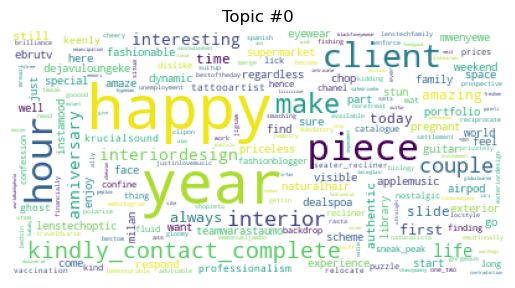

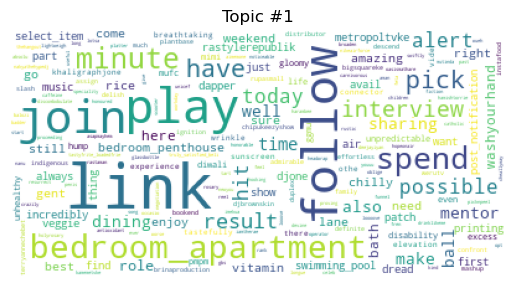

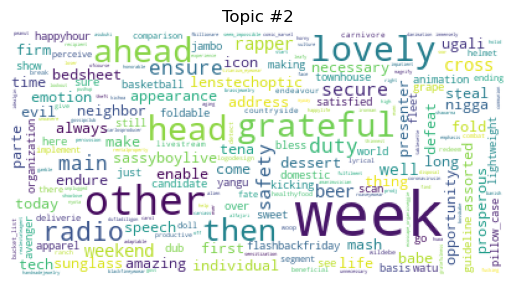

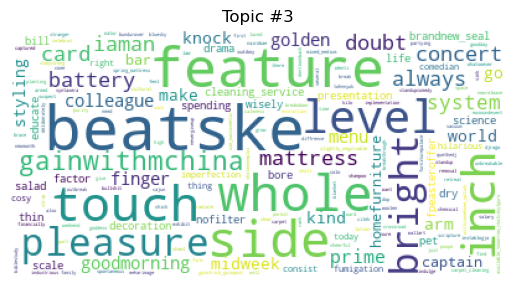

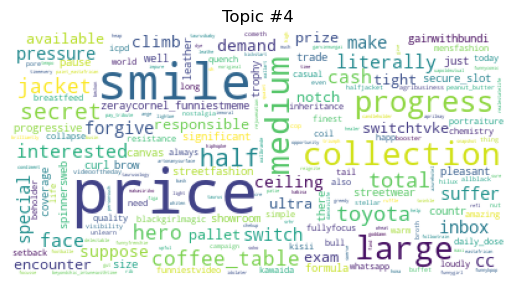

...

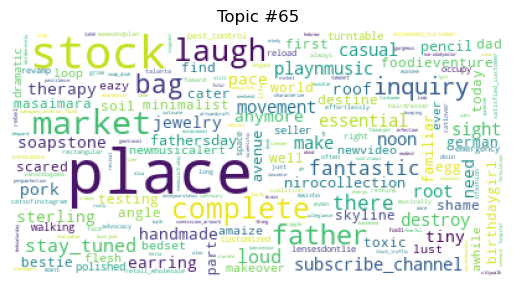

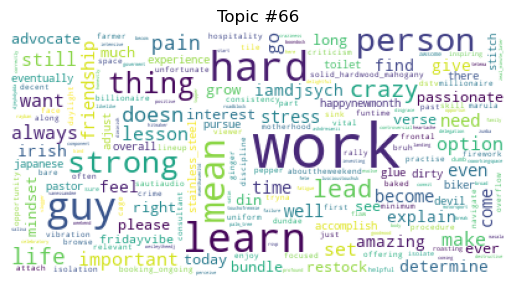

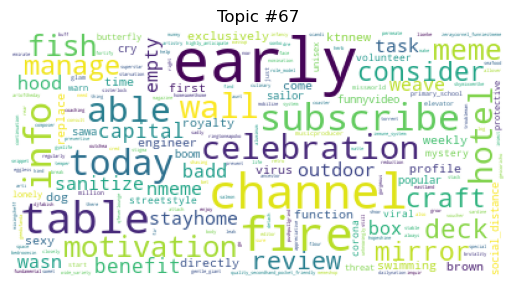

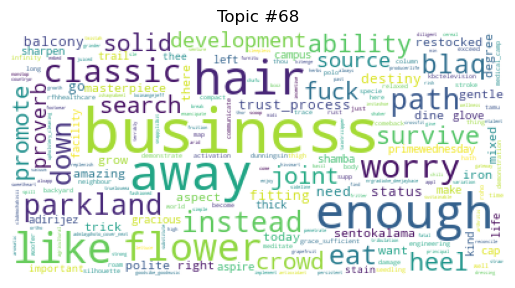

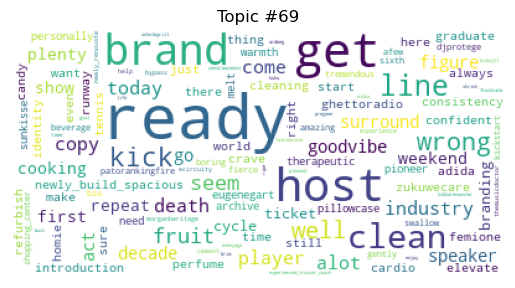

In [106]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

for t in range(lda_model.num_topics):
    plt.figure()
    plt.imshow(WordCloud(max_font_size=50, max_words = 300, background_color="white"). # Set word cloud parameters
               fit_words(dict(lda_model.show_topic(t, 200))))

    plt.axis("off")
    plt.title("Topic #" + str(t))
    plt.savefig(path + '/' + str(t) + '.png', dpi = 2000)
#     https://stackoverflow.com/questions/65271854/how-to-view-and-save-the-wordcloud-generated-in-python
    plt.show()

# wordcloud.to_file("img/first_review.png")

### LDA Model

In [107]:
# Export
lda_model.save(path + 'model.model')

In [108]:
# Reload
# path = '/Users/wenlanzhang/Downloads/PhD_UCL/Data/Twitter/LDA_Model/25/model.model'
new_model = gensim.models.ldamodel.LdaModel.load(path + 'model.model')

In [109]:
# Copied from before to check if it is the same model 
test_doc = corpus[-1]

vector = new_model[test_doc]
print (vector)

def Sort(sub_li):
    sub_li.sort(key = lambda x: x[1])
    sub_li.reverse()
    return (sub_li)
new_vector = Sort(vector)
# 和上面的一样

print (new_vector)
#这个不一样不知道为啥

[(20, 0.0110928435), (38, 0.2817057), (51, 0.279969), (55, 0.0107225785)]
[(38, 0.2817057), (51, 0.279969), (20, 0.0110928435), (55, 0.0107225785)]


### LDA Output df

In [110]:
Col = list(dfTextAll.columns)
Col.append(list(range(num_topics)))
Col
# new = pd.concat([dfEnA,pd.DataFrame(columns=newcol)])

['text',
 'created_at',
 'geometry',
 'index_right',
 'GeometryBUP',
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 20,
 21,
 22,
 23,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 37,
 38,
 39,
 40,
 42,
 43,
 44,
 45,
 48,
 49,
 18,
 19,
 24,
 25,
 26,
 34,
 35,
 36,
 41,
 46,
 47,
 50,
 52,
 53,
 55,
 56,
 58,
 59,
 63,
 65,
 70,
 71,
 72,
 76,
 88,
 95,
 98,
 99,
 74,
 78,
 54,
 67,
 77,
 66,
 89,
 91,
 87,
 80,
 93,
 68,
 85,
 64,
 57,
 84,
 61,
 83,
 94,
 90,
 81,
 73,
 51,
 62,
 60,
 69,
 75,
 97,
 92,
 86,
 79,
 82,
 96,
 [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69]]

In [111]:
from tqdm import tqdm

for i in tqdm(range(len(corpus))):
#     k = len(corpus[i])
#     print(k)

    vector = lda_model[corpus[i]]
#     print (vector)
#     print(len(vector))
    for seq in range(0, len(vector)):
#         print(vector[seq][0])
#         print(vector[seq][1])
        dfTextAll.at[i, vector[seq][0]] = vector[seq][1]

100%|█████████████████████████████████| 172473/172473 [00:21<00:00, 8101.77it/s]


In [112]:
# Export
dfTextAll.to_csv(path + str(num_topics) + 'Full.csv', index = False)